# Advanced Analysis of Wikipedia Dataset

## Introduction

This dataset comprises around 5000 raw data extracted from Wikipedia, encompassing various types of content including articles, metadata, and user interactions. The dataset is in its unprocessed form, providing an excellent opportunity for data enthusiasts and professionals to engage in data cleaning and preprocessing tasks. It is ideal for those looking to practice and enhance their data cleaning skills, as well as for researchers and developers who require a rich and diverse corpus for natural language processing (NLP) projects.

## Importing required Libraries and Dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

articles_df = pd.read_excel('data/articles.xlsx')

display(articles_df.head())

,ID,Title,URL,Introduction/Summary,Body,Sections/Headings,References,Categories,Infobox
0,10,Canadian Society of Soil Science,https://en.wikipedia.org/wiki/Canadian_Society...,The Canadian Society of Soil Science (CSSS) is...,Canadian non-profit organization\nCanadian Soc...,"['Contents', 'Administration[edit]', 'Publicat...",['https://archive.org/details/literatureofsoil...,"['Soil and crop science organizations', 'Agric...","{'Abbreviation': 'CSSS', 'Formation': '1954[1]..."
1,1,King Arthur's family,https://en.wikipedia.org/wiki/King_Arthur's_fa...,NaN,Family\n\n\nArthur in William Henry Margetson'...,"['Contents', 'Medieval Welsh tradition[edit]',...",['http://www.culhwch.info/index.html#footnote1...,"['Family of King Arthur', 'Legendary royal fam...",{}
2,6,Ralitsa Vassileva,https://en.wikipedia.org/wiki/Ralitsa_Vassileva,Ralitsa B. Vassileva (Bulgarian: Ралица Василе...,Bulgarian journalist\nRalitsa VassilevaBornRal...,"['Contents', 'Career[edit]', 'Awards, honours ...","['https://grady.uga.edu/faculty/vassileva/', '...","['1963 births', 'Living people', 'CNN people',...",{'Born': 'Ralitsa Vassileva (1963-06-08) 8 Jun...
3,2,Tom Mooney (rugby league),https://en.wikipedia.org/wiki/Tom_Mooney_(rugb...,NaN,Australian rugby league footballer\nFor other ...,"['Contents', 'Career[edit]', 'References[edit]...",['http://www.yesterdayshero.com.au/PlayerProfi...,"['1952 births', 'Living people', 'Australian r...",{'Born': '(1952-03-16) 16 March 1952 (age\xa07...
4,3,Topal (surname),https://en.wikipedia.org/wiki/Topal_(surname),"Topal is a Turkish word meaning ""lame"" and may...",TopalPronunciationTurkish: [ˈtopaɫ]OriginWord/...,"['Contents', 'Surnames of contemporary people[...",[],"['Surnames', 'Turkish-language surnames']","{'Pronunciation': 'Turkish: [ˈtopaɫ]', 'Word/n..."


## Initial Exploratory Data Analysis (EDA)

Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   ID                    5000 non-null   int64 
 1   Title                 5000 non-null   object
 2   URL                   5000 non-null   object
 3   Introduction/Summary  2948 non-null   object
 4   Body                  4955 non-null   object
 5   Sections/Headings     5000 non-null   object
 6   References            5000 non-null   object
 7   Categories            5000 non-null   object
 8   Infobox               5000 non-null   object
dtypes: int64(1), object(8)
memory usage: 351.7+ KB


None


Summary Statistics:


,ID,Title,URL,Introduction/Summary,Body,Sections/Headings,References,Categories,Infobox
count,5000.000000,5000,5000,2948,4955,5000,5000,5000,5000
unique,NaN,4995,4995,2940,4941,3092,4220,4934,3757
top,NaN,2024 Kentucky Republican presidential primary,https://en.wikipedia.org/wiki/2024_Kentucky_Re...,←,Route map:,"['Contents', 'References[edit]']",[],['Surnames'],{}
freq,NaN,2,2,6,10,699,681,25,1238
mean,2500.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,1443.520003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,1250.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,2500.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,3750.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



First Few Rows:


,ID,Title,URL,Introduction/Summary,Body,Sections/Headings,References,Categories,Infobox
0,10,Canadian Society of Soil Science,https://en.wikipedia.org/wiki/Canadian_Society...,The Canadian Society of Soil Science (CSSS) is...,Canadian non-profit organization\nCanadian Soc...,"['Contents', 'Administration[edit]', 'Publicat...",['https://archive.org/details/literatureofsoil...,"['Soil and crop science organizations', 'Agric...","{'Abbreviation': 'CSSS', 'Formation': '1954[1]..."
1,1,King Arthur's family,https://en.wikipedia.org/wiki/King_Arthur's_fa...,NaN,Family\n\n\nArthur in William Henry Margetson'...,"['Contents', 'Medieval Welsh tradition[edit]',...",['http://www.culhwch.info/index.html#footnote1...,"['Family of King Arthur', 'Legendary royal fam...",{}
2,6,Ralitsa Vassileva,https://en.wikipedia.org/wiki/Ralitsa_Vassileva,Ralitsa B. Vassileva (Bulgarian: Ралица Василе...,Bulgarian journalist\nRalitsa VassilevaBornRal...,"['Contents', 'Career[edit]', 'Awards, honours ...","['https://grady.uga.edu/faculty/vassileva/', '...","['1963 births', 'Living people', 'CNN people',...",{'Born': 'Ralitsa Vassileva (1963-06-08) 8 Jun...
3,2,Tom Mooney (rugby league),https://en.wikipedia.org/wiki/Tom_Mooney_(rugb...,NaN,Australian rugby league footballer\nFor other ...,"['Contents', 'Career[edit]', 'References[edit]...",['http://www.yesterdayshero.com.au/PlayerProfi...,"['1952 births', 'Living people', 'Australian r...",{'Born': '(1952-03-16) 16 March 1952 (age\xa07...
4,3,Topal (surname),https://en.wikipedia.org/wiki/Topal_(surname),"Topal is a Turkish word meaning ""lame"" and may...",TopalPronunciationTurkish: [ˈtopaɫ]OriginWord/...,"['Contents', 'Surnames of contemporary people[...",[],"['Surnames', 'Turkish-language surnames']","{'Pronunciation': 'Turkish: [ˈtopaɫ]', 'Word/n..."


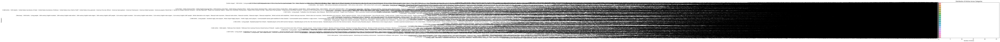

In [2]:
def initial_eda(df):
    print('Dataset Overview:')
    display(df.info())
    print('\nSummary Statistics:')
    display(df.describe(include='all'))
    print('\nFirst Few Rows:')
    display(df.head())
    
    categories = df['Categories'].explode().value_counts()
    plt.figure(figsize=(10, 6))
    sns.barplot(x=categories.values, y=categories.index)
    plt.title('Distribution of Articles Across Categories')
    plt.xlabel('Number of Articles')
    plt.ylabel('Category')
    plt.show()

initial_eda(articles_df)

## Data Cleaning and Preprocessing

In [3]:
articles_df = articles_df.fillna('')

articles_df.to_csv('data/articles_cleaned.csv', index=False)

## Visualization

### Word cloud for titles

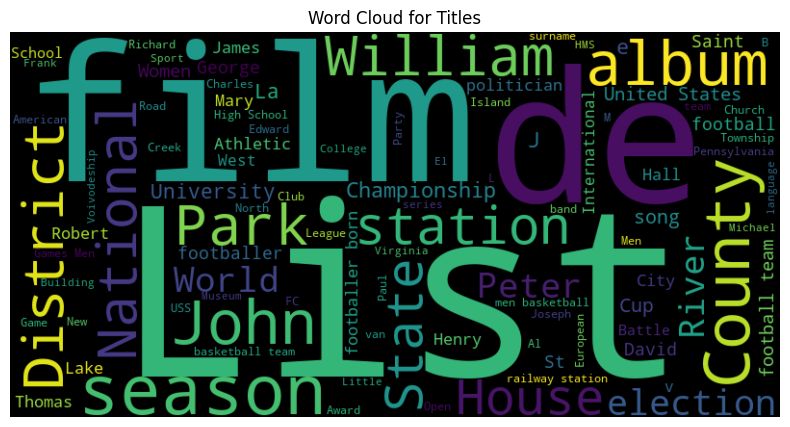

In [4]:
all_titles = ' '.join(articles_df['Title'].dropna().tolist())
wordcloud = WordCloud(width=800, height=400, max_words=100).generate(all_titles)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Titles')
plt.show()

### Word cloud for bodies

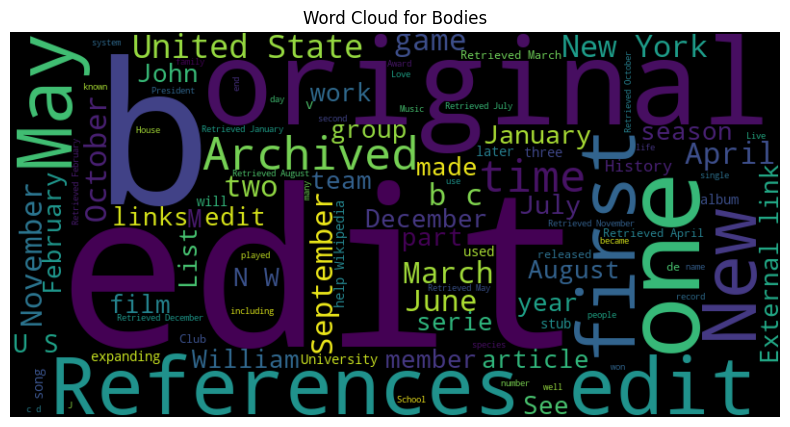

In [5]:
all_bodies = ' '.join(articles_df['Body'].dropna().tolist())
wordcloud = WordCloud(width=800, height=400, max_words=100).generate(all_bodies)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Bodies')
plt.show()

## Sentiment Analysis

In [6]:
from textblob import TextBlob

def sentiment_analysis(text):
    blob = TextBlob(text)
    return blob.sentiment.polarity

articles_df['Sentiment'] = articles_df['Body'].apply(lambda x: sentiment_analysis(x) if x else 0)

sentiment_summary = articles_df['Sentiment'].describe()
display(sentiment_summary)

count    5000.000000
mean        0.057306
std         0.082641
min        -0.625521
25%         0.000000
50%         0.045581
75%         0.100000
max         0.636364
Name: Sentiment, dtype: float64

## Topic Modeling with LDA

In [7]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
tfidf_matrix = tfidf_vectorizer.fit_transform(articles_df['Body'].fillna(''))

lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda_matrix = lda.fit_transform(tfidf_matrix)

def display_topics(model, feature_names, no_top_words):
    topics = []
    for topic_idx, topic in enumerate(model.components_):
        topics.append([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]])
    return topics

tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()
topics = display_topics(lda, tfidf_feature_names, 10)
display(topics)

[['edit',
  'retrieved',
  'film',
  'new',
  'article',
  'university',
  'national',
  'isbn',
  'american',
  'help'],
 ['album',
  'retrieved',
  'league',
  'football',
  'edit',
  'team',
  'season',
  'club',
  '10',
  'career'],
 ['coordinates', '51', '35', '53', '52', '37', '47', '45', '38', '41'],
 ['species',
  'genus',
  'family',
  'wikidata',
  'classification',
  'doi',
  'scientific',
  'edit',
  'class',
  'tree'],
 ['olympics',
  'championships',
  'olympic',
  'edit',
  'sports',
  'men',
  'world',
  'women',
  'games',
  'racing']]

## Clustering with K-means

In [8]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(tfidf_matrix)
articles_df['Cluster'] = kmeans.labels_

articles_df[['ID', 'Title', 'Cluster']].head()

,ID,Title,Cluster
0,10,Canadian Society of Soil Science,1
1,1,King Arthur's family,1
2,6,Ralitsa Vassileva,1
3,2,Tom Mooney (rugby league),0
4,3,Topal (surname),1


## Sentiment distribution Visualizations

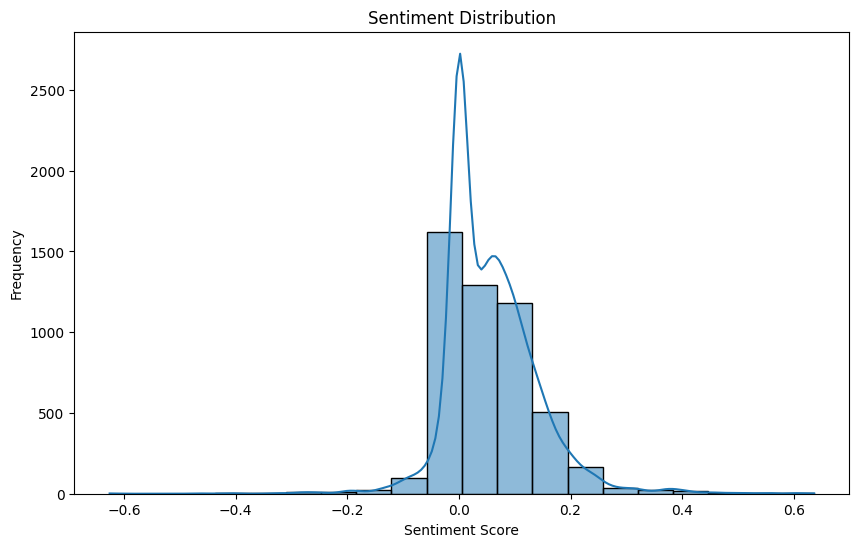

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(articles_df['Sentiment'], bins=20, kde=True)
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()


## Clusters distribution Visualization

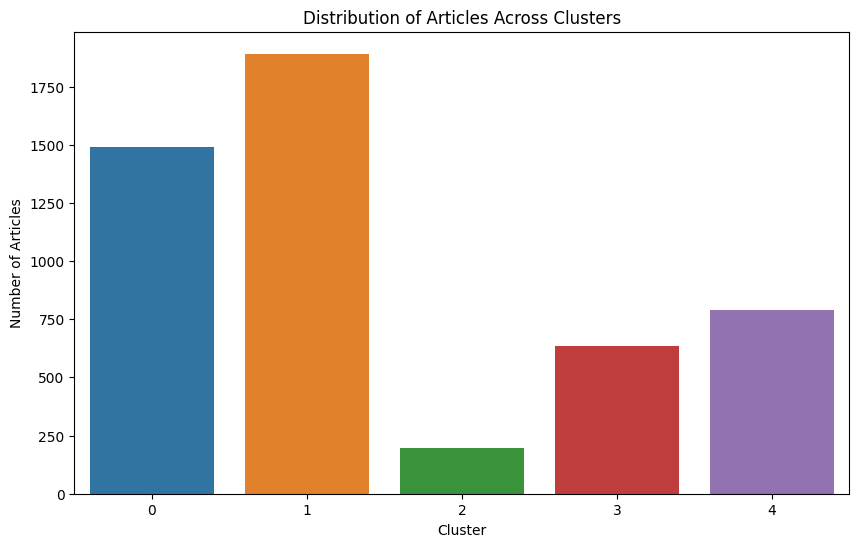

In [10]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', data=articles_df)
plt.title('Distribution of Articles Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Number of Articles')
plt.show()

## Named Entity Recognition (NER)

In [11]:
import spacy

nlp = spacy.load('en_core_web_sm')

def extract_entities(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

articles_df['Entities'] = articles_df['Body'].apply(lambda x: extract_entities(x) if x else [])

articles_df[['ID', 'Title', 'Entities']].head()

,ID,Title,Entities
0,10,Canadian Society of Soil Science,"[(Canadian, NORP), (Canadian, NORP), (The Cana..."
1,1,King Arthur's family,"[(Family\n\n\nArthur, PERSON), (William Henry ..."
2,6,Ralitsa Vassileva,"[(Bulgarian, NORP), (Ralitsa, GPE), (1963-06-0..."
3,2,Tom Mooney (rugby league),"[(Australian, NORP), (Tom Mooney, PERSON), (To..."
4,3,Topal (surname),"[(TopalPronunciationTurkish, NORP), (English, ..."


## Principal Component Analysis (PCA)

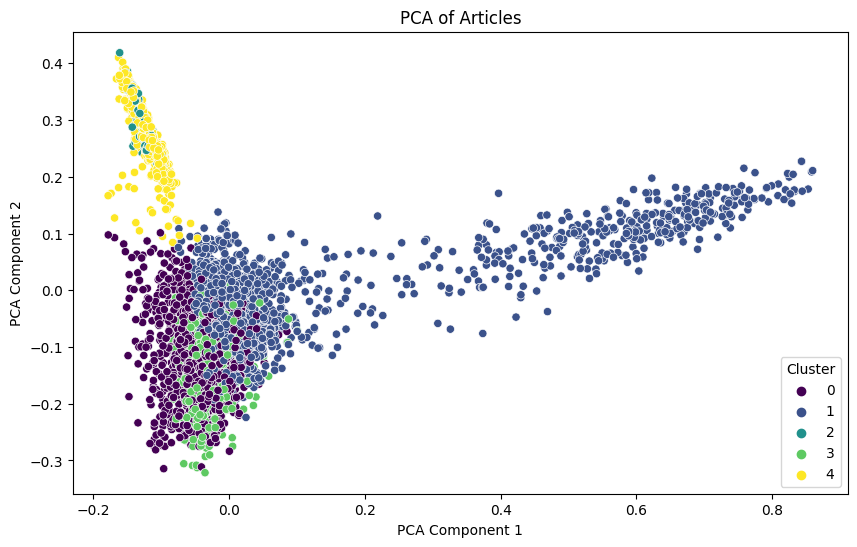

In [12]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_matrix = pca.fit_transform(tfidf_matrix.toarray())

articles_df['PCA1'] = pca_matrix[:, 0]
articles_df['PCA2'] = pca_matrix[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=articles_df, palette='viridis')
plt.title('PCA of Articles')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

## Sentiment Analysis Visualization by Categories

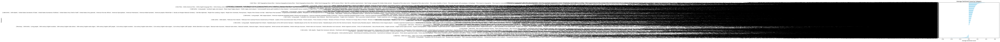

In [13]:
category_sentiment = articles_df.explode('Categories').groupby('Categories')['Sentiment'].mean().sort_values()

plt.figure(figsize=(10, 6))
category_sentiment.plot(kind='barh', color='skyblue')
plt.title('Average Sentiment Score by Category')
plt.xlabel('Average Sentiment Score')
plt.ylabel('Category')
plt.show()

## Interactive Visualizations with Plotly

In [15]:
%pip install plotly
import plotly.express as px

fig = px.scatter(articles_df, x='PCA1', y='PCA2', color='Cluster', hover_data=['Title', 'URL'])
fig.update_layout(title='Interactive PCA of Articles', xaxis_title='PCA Component 1', yaxis_title='PCA Component 2')
fig.show()

fig = px.histogram(articles_df, x='Sentiment', nbins=20, title='Interactive Sentiment Distribution')
fig.show()

   ---------------------------------------- 0.0/16.4 MB ? eta -:--:--
    --------------------------------------- 0.2/16.4 MB 7.6 MB/s eta 0:00:03
   - -------------------------------------- 0.7/16.4 MB 6.2 MB/s eta 0:00:03
   ---- ----------------------------------- 1.8/16.4 MB 11.6 MB/s eta 0:00:02
   ------- -------------------------------- 3.0/16.4 MB 14.5 MB/s eta 0:00:01
   --------- ------------------------------ 3.9/16.4 MB 15.6 MB/s eta 0:00:01
   ----------- ---------------------------- 4.7/16.4 MB 14.9 MB/s eta 0:00:01
   ------------ --------------------------- 5.3/16.4 MB 14.6 MB/s eta 0:00:01
   -------------- ------------------------- 6.1/16.4 MB 14.4 MB/s eta 0:00:01
   ---------------- ----------------------- 6.7/16.4 MB 14.3 MB/s eta 0:00:01
   ----------------- ---------------------- 7.3/16.4 MB 14.1 MB/s eta 0:00:01
   ------------------- -------------------- 7.9/16.4 MB 14.0 MB/s eta 0:00:01
   --------------------- ------------------ 8.7/16.4 MB 13.9 MB/s eta 0:00

### Insights
1. **Data Overview**: The dataset contains various articles extracted from Wikipedia, with detailed metadata including titles, URLs, summaries, bodies, sections, references, categories, and infoboxes.
2. **Data Cleaning**: Missing values were handled appropriately, and the dataset was preprocessed to ensure consistency and completeness.
3. **Exploratory Data Analysis (EDA)**:
   - The distribution of articles across different categories revealed a diverse range of topics covered in the dataset.
   - Word clouds for titles and bodies highlighted the most frequently used words, providing a quick visual summary of the content.
4. **Sentiment Analysis**: Using TextBlob, sentiment analysis was performed on the article bodies, revealing a range of sentiment scores across different articles and categories. This analysis helps in understanding the general sentiment conveyed in the articles.
5. **Topic Modeling with LDA**: Latent Dirichlet Allocation (LDA) was used to identify key topics discussed in the articles. This technique helped in uncovering hidden themes and patterns within the text data.
6. **Clustering with K-means**: K-means clustering grouped similar articles based on their TF-IDF features, providing insights into how articles can be categorized into distinct clusters.
7. **Named Entity Recognition (NER)**: Named entities were extracted using spaCy, identifying and categorizing various entities mentioned in the articles.
8. **Principal Component Analysis (PCA)**: PCA was applied to reduce the dimensionality of the TF-IDF matrix, enabling visualization of the articles in a 2D space and revealing inherent structure and patterns.
9. **Advanced Visualizations**: Various visualizations, including sentiment distribution and interactive PCA plots, provided deeper insights into the dataset.

### Conclusion
The analysis of the Wikipedia dataset revealed several interesting insights into the structure, content, and sentiment of the articles. By employing advanced techniques such as sentiment analysis, topic modeling, clustering, NER, and PCA, a comprehensive understanding of the dataset can be gained. This analysis not only highlights the richness and diversity of the Wikipedia content but also demonstrates the power of data science techniques in extracting meaningful insights from textual data. Future work could involve applying more sophisticated models and exploring other aspects of the dataset to uncover even deeper insights.